# Neural Cellular Automata Demo

This Jupyter notebook functions as a minimal demonstration of the Neural Cellular Automata (NCA) framework. The following notebook shows how to train NCA models to: sequences of data; and PDEs. This also demonstrates saving and loading models, continuing the training of saved models and modifying different model/training hyperparameters.

In [1]:
from NCA_class import *
from NCA_train import *
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from tqdm.notebook import tqdm 
%matplotlib inline
# Works with or without a GPU, tensorflow will complain a bit on import regardless.

2023-03-15 11:55:45.863000: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-03-15 11:55:45.863020: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
/home/s1605376/Virtual Environments/my_python/lib/python3.8/site-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.8.0 and strictly below 2.11.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.6.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow

# Image sequence learning
Recreating and extending the results of https://distill.pub/2020/growing-ca/ , we train NCA to morph between arbitrary images. We extend the original framework by allowing an arbitrarily long trajectory through a sequence of images to be learned.

### Define model parameters
Note that most model parameters are optional with defaults. The NCA class takes as input:
- N_CHANNELS: int
    - the number of channels for the state space
- FIRE_RATE: float [0,1]
    - the probability of each pixel updating at each timestep. 1 - dropout rate in terms of neural network literature
- ADHESION_MASK: boolean array [size,size] optional 
    - A binary mask encoding information about the space the NCA is running on. Hard codes one of the channels to this, useful for indicating non-square boundaries or presence of adhesive surfaces in micropatterning. Defaults to None
- ACTIVATION: str optional
    - String corresponding to tensorflow activation functions. Defaults to swish
- LAYERS: int optional
    - Number of layers in the neural network. So far only 2 or 3 is implemented. Defaults to 2
- OBS_CHANNELS : int optional
	- How many of the channels are 'observable', i.e. fitted to target data. Defaults to 4 (RGBA)
- REGULARIZER : float optional
    - strength of L1 regularisation for neural network weights. Defaults to 0.01
- PADDING : string optional
	- 'zero', 'flat' or 'periodic' boundary conditions. Defaults to 'periodic'
- KERNEL_TYPE : string optional
	- What type of kernels to use. Defaults to "ID_LAP_AV". Valid options are:
        - "ID_LAP", "ID_AV", "ID_DIFF", 					- Identity and 1 other
		- "ID_LAP_AV","ID_DIFF_AV","ID_DIFF_LAP",			- Identity and 2 others
		- "ID_DIFF_LAP_AV",									- Identity and all 3 others
		- "DIFF_LAP_AV","DIFF_AV","LAP_AV"					- Average and other non-identity
- ORDER : int optional
	- Highest order polynomial terms of channels. Defaults to 1
        - 1 - only linear channels, no cross terms
        - 2 - up to squared cross terms
        - 3 - not yet implemented

In [2]:
N_CHANNELS = 16
PADDING = "zero"

### Create NCA instance

In [3]:
model = NCA(N_CHANNELS,PADDING=PADDING)

# print the model for more verbose information
#print(model)

2023-03-15 11:55:58.024496: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-03-15 11:55:58.024518: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2023-03-15 11:55:58.024533: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (s1605376-HP-EliteBook-850-G7-Notebook-PC): /proc/driver/nvidia/version does not exist
2023-03-15 11:55:58.024738: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (1, 3, 3, 64)             3072      
_________________________________________________________________
conv2d_1 (Conv2D)            (1, 3, 3, 16)             1040      
Total params: 4,112
Trainable params: 4,112
Non-trainable params: 0
_________________________________________________________________
None


2023-03-15 11:55:58.276009: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


### Load image sequence data and initialise training
Load 3 emoji examples stored on this repository.
Data is a numpy ndarray of shape [3,1,X,Y,C] where X,Y is the size of the image and C is the number of channels (here 4, RGBA). The dimension of size 1 is the batches dimension, for if we do data augmentation or want to train one NCA to a set of trajectories.

The NCA_Trainer class handles the training of NCA models to data. It's parameters are:

- NCA_model : object callable - float32 tensor [batches,size,size,N_CHANNELS],float32,float32 -> float32 tensor [batches,size,size,N_CHANNELS]
  - the NCA object to train
- data : float32 tensor [T,batches,size,size,4]
  - The image sequence being modelled. data[0] is treated as the initial condition
- N_BATCHES : int
  - size of training batch
- model_filename : str
  - name of directories to save tensorboard log and model parameters to.
    - log at :	'logs/gradient_tape/model_filename/train'
    - model at : 	'models/model_filename'
    - if None, sets model_filename to current time
- RGB_mode : string
  - Expects "RGBA" "RGB" or "RGB-A"
  - Defines how to log image channels to tensorboard
    - RGBA : 4 channel RGBA image (i.e. PNG with transparancy)
    - RGB : 3 channel RGB image
    - RGB-A : 3+1 channel - a 3 channel RGB image alongside a black and white image representing the alpha channel
- directory : str
  - Name of directory where all models get stored, defaults to 'models/'
		

Saving to: demo_data/emoji_sequence_demo
Instructions for updating:
use `tf.profiler.experimental.start` instead.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
Instructions for updating:
`tf.python.eager.profiler` has deprecated, use `tf.profiler` instead.
Instructions for updating:
`tf.python.eager.profiler` has deprecated, use `tf.profiler` instead.
---Shapes of NCA_Trainer variables---
data: (3, 1, 60, 60, 4)
X0: (2, 60, 60, 16)
Target: (2, 60, 60, 4)
(3, 1, 60, 60, 4)


2023-03-15 11:56:06.093816: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-03-15 11:56:06.093840: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2023-03-15 11:56:06.106893: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2023-03-15 11:56:06.107300: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2023-03-15 11:56:06.108871: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-03-15 11:56:06.108885: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2023-03-15 11:56:06.158620: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2023-03-15 11:56:06.158887: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.


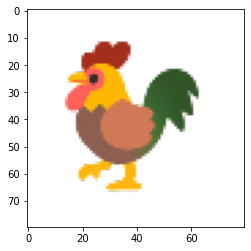

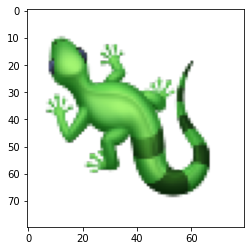

In [4]:
from NCA_utils import load_emoji_sequence

data = load_emoji_sequence(["alien_monster.png","rooster.png","lizard.png"],"demo_data/",downsample=2)
#plt.imshow(data[0,0])

N_BATCHES = 1

emoji_trainer = NCA_Trainer(model,data,N_BATCHES,model_filename="emoji_sequence_demo",directory="demo_data/")
emoji_trainer.data_pad_augment(4,10)
emoji_trainer.data_noise_augment(0.001)

### display data loaded into NCA_Trainer class

print(emoji_trainer.data.shape)
plt.imshow(emoji_trainer.x0[4,...,:4])
plt.show()
plt.imshow(emoji_trainer.target[4,...,:4])
plt.show()


### Train model
Trainer parameters:

- TRAIN_ITERS: number of training epochs
- iter_n: number of NCA steps between images. Should be comparable to the image resolution
- OPTIMIZER: which builtin tensorflow optimizer to use
- LEARN_RATE: learning rate for OPTIMIZER

#### With current settings, takes about 4 hours to train without GPU acceleration

In [16]:
emoji_trainer.train_sequence(TRAIN_ITERS=4000,iter_n=60,OPTIMIZER="Nadam",LEARN_RATE=2e-3)


Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (1, 7, 7, 64)             3072      
_________________________________________________________________
conv2d_17 (Conv2D)           (1, 7, 7, 16)             1040      
Total params: 4,112
Trainable params: 4,112
Non-trainable params: 0
_________________________________________________________________
None


Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (1, 7, 7, 64)             3072      
_________________________________________________________________
conv2d_19 (Conv2D)           (1, 7, 7, 16)             1040      
Total params: 4,112
Trainable params: 4,112
Non-trainable params: 0
_________________________________________________________________
None


### Load existing models
load_wrapper takes the model filename and directory as provided to the NCA_Trainer on intialisation. As with the NCA_Trainer, directory defaults to "models/" but for the purposes of this demo is set to "demo_data/"

In [7]:
model = load_wrapper("emoji_sequence_demo",directory="demo_data/")
model_stable = load_wrapper("emoji_alien_rooster_stable_demo_continued",directory="demo_data/")

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (1, 7, 7, 64)             3072      
_________________________________________________________________
conv2d_7 (Conv2D)            (1, 7, 7, 16)             1040      
Total params: 4,112
Trainable params: 4,112
Non-trainable params: 0
_________________________________________________________________
None


Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (1, 7, 7, 64)             3072      
_________________________________________________________________
conv2d_9 (Conv2D)            (1, 7, 7, 16)             1040      
Total params: 4,112
Trainable params: 4,112
Non-trainable params: 0
_________________________________________________________________
None


### Visualise trained models

By loading in the intial condition with a little pre-processing (padding with 0s to separate from the boundary effects), we can visualise the dynamics of a trained NCA

(300, 1, 140, 140, 16)


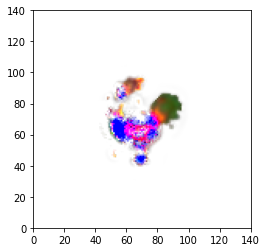

In [8]:

T = 300
data = np.pad(data,((0,0),(0,0),(20,20),(20,20),(0,0)))
data = model_stable.run(data[0],T)
print(data.shape)
data = np.clip(data,a_max=1,a_min=0)

fig, ax = plt.subplots()

im = ax.imshow(data[0,0,...,:4],origin="lower")

ax.set_xlim(0, data.shape[2])
ax.set_ylim(0,data.shape[3])

def animate(frame_num):
    #y = np.sin(x + 2*np.pi * frame_num/100)
    
    im.set_data(data[frame_num,0,::-1,...,:4])
    return im

anim = FuncAnimation(fig, animate, frames=T, interval=5)
HTML(anim.to_jshtml())
#plt.show()

### Stable NCA

Note that the learned dynamics from the NCA is not stable, in the sense that the final target of a rooster emoji is reached, but the NCA then diverges away from that as we continue the simulation. This can be addressed by augmenting the training data as follows:

In [8]:
data = load_emoji_sequence(["alien_monster.png","rooster.png","rooster.png"],"demo_data/",downsample=2)
#plt.imshow(data[0,0])

model_stable = NCA(N_CHANNELS,PADDING=PADDING)

N_BATCHES = 1

emoji_trainer_stable = NCA_Trainer(model_stable,data,N_BATCHES,model_filename="emoji_alien_rooster_stable_demo",directory="demo_data/")
emoji_trainer_stable.data_pad_augment(4,10)
emoji_trainer_stable.data_noise_augment(0.001)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (1, 3, 3, 64)             3072      
_________________________________________________________________
conv2d_5 (Conv2D)            (1, 3, 3, 16)             1040      
Total params: 4,112
Trainable params: 4,112
Non-trainable params: 0
_________________________________________________________________
None
Saving to: demo_data/emoji_alien_lizard_stable_demo
---Shapes of NCA_Trainer variables---
data: (3, 1, 60, 60, 4)
X0: (2, 60, 60, 16)
Target: (2, 60, 60, 4)


2023-03-09 14:30:41.745774: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-03-09 14:30:41.745794: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2023-03-09 14:30:41.760055: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2023-03-09 14:30:41.760257: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2023-03-09 14:30:41.761675: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-03-09 14:30:41.761689: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2023-03-09 14:30:41.803711: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2023-03-09 14:30:41.803987: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.


In [9]:
emoji_trainer_stable.train_sequence(TRAIN_ITERS=4000,iter_n=60,OPTIMIZER="Nadam",LEARN_RATE=2e-3)

4
(8, 80, 80, 16)
(8, 80, 80, 16)


 10%|███████████▉                                                                                                           | 401/4000 [20:37<3:09:28,  3.16s/it]2023-03-09 14:52:11.014752: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 10%|███████████▉                                                                                                           | 401/4000 [20:41<3:09:28,  3.16s/it]

--- Model saved at 401 epochs ---


 10%|███████████▉                                                                                                           | 403/4000 [20:47<3:56:06,  3.94s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 10%|███████████▉                                                                                                           | 403/4000 [20:51<3:56:06,  3.94s/it]

--- Model saved at 403 epochs ---


 10%|████████████                                                                                                           | 404/4000 [20:54<4:53:02,  4.89s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 10%|████████████                                                                                                           | 404/4000 [20:58<4:53:02,  4.89s/it]

--- Model saved at 404 epochs ---


 10%|████████████▎                                                                                                          | 413/4000 [21:28<3:29:24,  3.50s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 10%|████████████▎                                                                                                          | 413/4000 [21:32<3:29:24,  3.50s/it]

--- Model saved at 413 epochs ---


 10%|████████████▍                                                                                                          | 418/4000 [21:49<3:37:27,  3.64s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 10%|████████████▍                                                                                                          | 418/4000 [21:53<3:37:27,  3.64s/it]

--- Model saved at 418 epochs ---


 10%|████████████▍                                                                                                          | 420/4000 [22:00<4:23:59,  4.42s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 10%|████████████▍                                                                                                          | 420/4000 [22:04<4:23:59,  4.42s/it]

--- Model saved at 420 epochs ---


 11%|████████████▌                                                                                                          | 422/4000 [22:10<4:38:30,  4.67s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 11%|████████████▌                                                                                                          | 422/4000 [22:15<4:38:30,  4.67s/it]

--- Model saved at 422 epochs ---


 12%|█████████████▋                                                                                                         | 462/4000 [24:25<3:14:21,  3.30s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 12%|█████████████▋                                                                                                         | 462/4000 [24:29<3:14:21,  3.30s/it]

--- Model saved at 462 epochs ---


 12%|█████████████▊                                                                                                         | 465/4000 [24:39<3:42:17,  3.77s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 12%|█████████████▊                                                                                                         | 465/4000 [24:43<3:42:17,  3.77s/it]

--- Model saved at 465 epochs ---


 12%|█████████████▊                                                                                                         | 466/4000 [24:46<4:43:29,  4.81s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 12%|█████████████▊                                                                                                         | 466/4000 [24:50<4:43:29,  4.81s/it]

--- Model saved at 466 epochs ---


 12%|██████████████                                                                                                         | 472/4000 [25:09<3:33:45,  3.64s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 12%|██████████████                                                                                                         | 472/4000 [25:13<3:33:45,  3.64s/it]

--- Model saved at 472 epochs ---


 12%|██████████████▏                                                                                                        | 476/4000 [25:26<3:41:30,  3.77s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 12%|██████████████▏                                                                                                        | 476/4000 [25:30<3:41:30,  3.77s/it]

--- Model saved at 476 epochs ---


 12%|██████████████▊                                                                                                        | 497/4000 [26:40<3:13:01,  3.31s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 12%|██████████████▊                                                                                                        | 497/4000 [26:44<3:13:01,  3.31s/it]

--- Model saved at 497 epochs ---


 12%|██████████████▊                                                                                                        | 498/4000 [26:47<4:20:42,  4.47s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 12%|██████████████▊                                                                                                        | 498/4000 [26:50<4:20:42,  4.47s/it]

--- Model saved at 498 epochs ---


 14%|████████████████                                                                                                       | 540/4000 [29:02<2:52:45,  3.00s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 14%|████████████████                                                                                                       | 540/4000 [29:06<2:52:45,  3.00s/it]

--- Model saved at 540 epochs ---


 14%|█████████████████▏                                                                                                     | 577/4000 [31:05<3:10:50,  3.35s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 14%|█████████████████▏                                                                                                     | 577/4000 [31:09<3:10:50,  3.35s/it]

--- Model saved at 577 epochs ---


 15%|█████████████████▌                                                                                                     | 591/4000 [31:55<3:16:32,  3.46s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 15%|█████████████████▌                                                                                                     | 591/4000 [31:59<3:16:32,  3.46s/it]

--- Model saved at 591 epochs ---


 15%|█████████████████▋                                                                                                     | 593/4000 [32:05<3:52:27,  4.09s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 15%|█████████████████▋                                                                                                     | 593/4000 [32:09<3:52:27,  4.09s/it]

--- Model saved at 593 epochs ---


 16%|██████████████████▊                                                                                                    | 631/4000 [34:08<3:00:08,  3.21s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 16%|██████████████████▊                                                                                                    | 631/4000 [34:11<3:00:08,  3.21s/it]

--- Model saved at 631 epochs ---


 16%|███████████████████                                                                                                    | 641/4000 [34:45<3:05:29,  3.31s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 16%|███████████████████                                                                                                    | 641/4000 [34:49<3:05:29,  3.31s/it]

--- Model saved at 641 epochs ---


 17%|███████████████████▊                                                                                                   | 665/4000 [36:04<2:50:47,  3.07s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 17%|███████████████████▊                                                                                                   | 665/4000 [36:08<2:50:47,  3.07s/it]

--- Model saved at 665 epochs ---


 17%|████████████████████▎                                                                                                  | 684/4000 [37:06<2:46:39,  3.02s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 17%|████████████████████▎                                                                                                  | 684/4000 [37:10<2:46:39,  3.02s/it]

--- Model saved at 684 epochs ---


 17%|████████████████████▍                                                                                                  | 687/4000 [37:18<3:12:39,  3.49s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 17%|████████████████████▍                                                                                                  | 687/4000 [37:22<3:12:39,  3.49s/it]

--- Model saved at 687 epochs ---


 17%|████████████████████▍                                                                                                  | 688/4000 [37:25<4:04:35,  4.43s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 17%|████████████████████▍                                                                                                  | 688/4000 [37:28<4:04:35,  4.43s/it]

--- Model saved at 688 epochs ---


 17%|████████████████████▋                                                                                                  | 696/4000 [37:52<2:54:48,  3.17s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 17%|████████████████████▋                                                                                                  | 696/4000 [37:56<2:54:48,  3.17s/it]

--- Model saved at 696 epochs ---


 20%|███████████████████████▋                                                                                               | 798/4000 [43:13<2:50:30,  3.20s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 20%|███████████████████████▋                                                                                               | 798/4000 [43:17<2:50:30,  3.20s/it]

--- Model saved at 798 epochs ---


 21%|█████████████████████████▍                                                                                             | 856/4000 [46:25<2:45:55,  3.17s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 21%|█████████████████████████▍                                                                                             | 856/4000 [46:29<2:45:55,  3.17s/it]

--- Model saved at 856 epochs ---


 23%|███████████████████████████▏                                                                                           | 912/4000 [49:25<2:40:29,  3.12s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 23%|███████████████████████████▏                                                                                           | 912/4000 [49:28<2:40:29,  3.12s/it]

--- Model saved at 912 epochs ---


 24%|████████████████████████████▌                                                                                          | 962/4000 [52:08<2:40:37,  3.17s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 24%|████████████████████████████▌                                                                                          | 962/4000 [52:12<2:40:37,  3.17s/it]

--- Model saved at 962 epochs ---


 26%|██████████████████████████████▋                                                                                       | 1042/4000 [56:29<2:35:22,  3.15s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 26%|██████████████████████████████▋                                                                                       | 1042/4000 [56:32<2:35:22,  3.15s/it]

--- Model saved at 1042 epochs ---


 27%|███████████████████████████████▍                                                                                      | 1066/4000 [57:50<2:39:35,  3.26s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 27%|███████████████████████████████▍                                                                                      | 1066/4000 [57:54<2:39:35,  3.26s/it]

--- Model saved at 1066 epochs ---


 28%|█████████████████████████████████                                                                                   | 1139/4000 [1:01:45<2:27:21,  3.09s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 28%|█████████████████████████████████                                                                                   | 1139/4000 [1:01:49<2:27:21,  3.09s/it]

--- Model saved at 1139 epochs ---


 29%|█████████████████████████████████▌                                                                                  | 1158/4000 [1:02:49<2:32:27,  3.22s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 29%|█████████████████████████████████▌                                                                                  | 1158/4000 [1:02:53<2:32:27,  3.22s/it]

--- Model saved at 1158 epochs ---


 30%|██████████████████████████████████▍                                                                                 | 1188/4000 [1:04:30<2:32:08,  3.25s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 30%|██████████████████████████████████▍                                                                                 | 1188/4000 [1:04:35<2:32:08,  3.25s/it]

--- Model saved at 1188 epochs ---


 30%|██████████████████████████████████▊                                                                                 | 1199/4000 [1:05:12<2:27:48,  3.17s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 30%|██████████████████████████████████▊                                                                                 | 1199/4000 [1:05:15<2:27:48,  3.17s/it]

--- Model saved at 1199 epochs ---


 31%|███████████████████████████████████▌                                                                                | 1227/4000 [1:06:43<2:24:17,  3.12s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 31%|███████████████████████████████████▌                                                                                | 1227/4000 [1:06:47<2:24:17,  3.12s/it]

--- Model saved at 1227 epochs ---


 31%|███████████████████████████████████▊                                                                                | 1237/4000 [1:07:17<2:23:08,  3.11s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 31%|███████████████████████████████████▊                                                                                | 1237/4000 [1:07:21<2:23:08,  3.11s/it]

--- Model saved at 1237 epochs ---


 32%|████████████████████████████████████▋                                                                               | 1263/4000 [1:08:47<2:34:08,  3.38s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 32%|████████████████████████████████████▋                                                                               | 1263/4000 [1:08:51<2:34:08,  3.38s/it]

--- Model saved at 1263 epochs ---


 33%|██████████████████████████████████████▊                                                                             | 1337/4000 [1:12:57<2:22:07,  3.20s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 33%|██████████████████████████████████████▊                                                                             | 1337/4000 [1:13:01<2:22:07,  3.20s/it]

--- Model saved at 1337 epochs ---


 36%|██████████████████████████████████████████                                                                          | 1452/4000 [1:19:10<2:10:23,  3.07s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 36%|██████████████████████████████████████████                                                                          | 1452/4000 [1:19:14<2:10:23,  3.07s/it]

--- Model saved at 1452 epochs ---


 37%|███████████████████████████████████████████                                                                         | 1485/4000 [1:20:57<2:12:30,  3.16s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 37%|███████████████████████████████████████████                                                                         | 1485/4000 [1:21:01<2:12:30,  3.16s/it]

--- Model saved at 1485 epochs ---


 38%|████████████████████████████████████████████▍                                                                       | 1534/4000 [1:23:35<2:07:22,  3.10s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 38%|████████████████████████████████████████████▍                                                                       | 1534/4000 [1:23:39<2:07:22,  3.10s/it]

--- Model saved at 1534 epochs ---


 39%|█████████████████████████████████████████████▋                                                                      | 1574/4000 [1:25:45<2:07:13,  3.15s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 39%|█████████████████████████████████████████████▋                                                                      | 1574/4000 [1:25:49<2:07:13,  3.15s/it]

--- Model saved at 1574 epochs ---


 40%|██████████████████████████████████████████████▌                                                                     | 1607/4000 [1:27:39<2:18:57,  3.48s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 40%|██████████████████████████████████████████████▌                                                                     | 1607/4000 [1:27:43<2:18:57,  3.48s/it]

--- Model saved at 1607 epochs ---


 41%|███████████████████████████████████████████████▋                                                                    | 1643/4000 [1:29:36<2:09:39,  3.30s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 41%|███████████████████████████████████████████████▋                                                                    | 1643/4000 [1:29:40<2:09:39,  3.30s/it]

--- Model saved at 1643 epochs ---


 42%|████████████████████████████████████████████████▌                                                                   | 1673/4000 [1:31:17<2:08:35,  3.32s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 42%|████████████████████████████████████████████████▌                                                                   | 1673/4000 [1:31:21<2:08:35,  3.32s/it]

--- Model saved at 1673 epochs ---


 42%|████████████████████████████████████████████████▌                                                                   | 1675/4000 [1:31:27<2:33:05,  3.95s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 42%|████████████████████████████████████████████████▌                                                                   | 1675/4000 [1:31:31<2:33:05,  3.95s/it]

--- Model saved at 1675 epochs ---


 42%|█████████████████████████████████████████████████                                                                   | 1693/4000 [1:32:29<2:07:32,  3.32s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 42%|█████████████████████████████████████████████████                                                                   | 1693/4000 [1:32:33<2:07:32,  3.32s/it]

--- Model saved at 1693 epochs ---


 43%|██████████████████████████████████████████████████▎                                                                 | 1734/4000 [1:34:48<2:03:04,  3.26s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 43%|██████████████████████████████████████████████████▎                                                                 | 1734/4000 [1:34:52<2:03:04,  3.26s/it]

--- Model saved at 1734 epochs ---


 43%|██████████████████████████████████████████████████▎                                                                 | 1737/4000 [1:35:02<2:27:08,  3.90s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 43%|██████████████████████████████████████████████████▎                                                                 | 1737/4000 [1:35:06<2:27:08,  3.90s/it]

--- Model saved at 1737 epochs ---


 43%|██████████████████████████████████████████████████▍                                                                 | 1738/4000 [1:35:10<3:06:19,  4.94s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 43%|██████████████████████████████████████████████████▍                                                                 | 1738/4000 [1:35:14<3:06:19,  4.94s/it]

--- Model saved at 1738 epochs ---


 44%|██████████████████████████████████████████████████▉                                                                | 1770/4000 [2:09:48<44:59:16, 72.63s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 44%|██████████████████████████████████████████████████▉                                                                | 1770/4000 [2:09:52<44:59:16, 72.63s/it]

--- Model saved at 1770 epochs ---


 45%|████████████████████████████████████████████████████                                                                | 1796/4000 [2:11:12<2:00:25,  3.28s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 45%|████████████████████████████████████████████████████                                                                | 1796/4000 [2:11:16<2:00:25,  3.28s/it]

--- Model saved at 1796 epochs ---


 46%|█████████████████████████████████████████████████████▌                                                              | 1849/4000 [2:14:16<2:00:19,  3.36s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 46%|█████████████████████████████████████████████████████▌                                                              | 1849/4000 [2:14:21<2:00:19,  3.36s/it]

--- Model saved at 1849 epochs ---


 47%|██████████████████████████████████████████████████████                                                              | 1863/4000 [2:15:08<2:06:37,  3.56s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 47%|██████████████████████████████████████████████████████                                                              | 1863/4000 [2:15:14<2:06:37,  3.56s/it]

--- Model saved at 1863 epochs ---


 47%|██████████████████████████████████████████████████████                                                              | 1864/4000 [2:15:18<3:11:23,  5.38s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 47%|██████████████████████████████████████████████████████                                                              | 1864/4000 [2:15:22<3:11:23,  5.38s/it]

--- Model saved at 1864 epochs ---


 48%|███████████████████████████████████████████████████████▊                                                            | 1923/4000 [2:18:43<1:53:53,  3.29s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 48%|███████████████████████████████████████████████████████▊                                                            | 1923/4000 [2:18:47<1:53:53,  3.29s/it]

--- Model saved at 1923 epochs ---


 48%|███████████████████████████████████████████████████████▊                                                            | 1924/4000 [2:18:50<2:30:58,  4.36s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 48%|███████████████████████████████████████████████████████▊                                                            | 1924/4000 [2:18:54<2:30:58,  4.36s/it]

--- Model saved at 1924 epochs ---


 50%|█████████████████████████████████████████████████████████▊                                                          | 1993/4000 [2:22:40<1:45:04,  3.14s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 50%|█████████████████████████████████████████████████████████▊                                                          | 1993/4000 [2:22:44<1:45:04,  3.14s/it]

--- Model saved at 1993 epochs ---


 50%|█████████████████████████████████████████████████████████▉                                                          | 1999/4000 [2:23:01<1:44:11,  3.12s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 50%|█████████████████████████████████████████████████████████▉                                                          | 1999/4000 [2:23:05<1:44:11,  3.12s/it]

--- Model saved at 1999 epochs ---


 51%|███████████████████████████████████████████████████████████                                                         | 2037/4000 [2:24:57<1:35:45,  2.93s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 51%|███████████████████████████████████████████████████████████                                                         | 2037/4000 [2:25:00<1:35:45,  2.93s/it]

--- Model saved at 2037 epochs ---


 51%|███████████████████████████████████████████████████████████▌                                                        | 2052/4000 [2:25:45<1:36:44,  2.98s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 51%|███████████████████████████████████████████████████████████▌                                                        | 2052/4000 [2:25:48<1:36:44,  2.98s/it]

--- Model saved at 2052 epochs ---


 51%|███████████████████████████████████████████████████████████▋                                                        | 2057/4000 [2:26:03<1:42:38,  3.17s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 51%|███████████████████████████████████████████████████████████▋                                                        | 2057/4000 [2:26:06<1:42:38,  3.17s/it]

--- Model saved at 2057 epochs ---


 51%|███████████████████████████████████████████████████████████▋                                                        | 2059/4000 [2:26:12<2:00:38,  3.73s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 51%|███████████████████████████████████████████████████████████▋                                                        | 2059/4000 [2:26:16<2:00:38,  3.73s/it]

--- Model saved at 2059 epochs ---


 52%|████████████████████████████████████████████████████████████▊                                                       | 2096/4000 [2:28:05<1:33:12,  2.94s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 52%|████████████████████████████████████████████████████████████▊                                                       | 2096/4000 [2:28:09<1:33:12,  2.94s/it]

--- Model saved at 2096 epochs ---


 53%|█████████████████████████████████████████████████████████████                                                       | 2107/4000 [2:28:41<1:33:35,  2.97s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 53%|█████████████████████████████████████████████████████████████                                                       | 2107/4000 [2:28:45<1:33:35,  2.97s/it]

--- Model saved at 2107 epochs ---


 53%|█████████████████████████████████████████████████████████████▋                                                      | 2126/4000 [2:29:41<1:31:55,  2.94s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 53%|█████████████████████████████████████████████████████████████▋                                                      | 2126/4000 [2:29:45<1:31:55,  2.94s/it]

--- Model saved at 2126 epochs ---


 53%|█████████████████████████████████████████████████████████████▉                                                      | 2136/4000 [2:30:14<1:32:48,  2.99s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 53%|█████████████████████████████████████████████████████████████▉                                                      | 2136/4000 [2:30:17<1:32:48,  2.99s/it]

--- Model saved at 2136 epochs ---


 55%|███████████████████████████████████████████████████████████████▌                                                    | 2190/4000 [2:32:56<1:27:46,  2.91s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 55%|███████████████████████████████████████████████████████████████▌                                                    | 2190/4000 [2:33:00<1:27:46,  2.91s/it]

--- Model saved at 2190 epochs ---


 55%|███████████████████████████████████████████████████████████████▊                                                    | 2200/4000 [2:33:29<1:28:54,  2.96s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 55%|███████████████████████████████████████████████████████████████▊                                                    | 2200/4000 [2:33:33<1:28:54,  2.96s/it]

--- Model saved at 2200 epochs ---


 56%|████████████████████████████████████████████████████████████████▋                                                   | 2229/4000 [2:34:58<1:26:30,  2.93s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 56%|████████████████████████████████████████████████████████████████▋                                                   | 2229/4000 [2:35:01<1:26:30,  2.93s/it]

--- Model saved at 2229 epochs ---


 57%|██████████████████████████████████████████████████████████████████▋                                                 | 2299/4000 [2:38:27<1:22:27,  2.91s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 57%|██████████████████████████████████████████████████████████████████▋                                                 | 2299/4000 [2:38:30<1:22:27,  2.91s/it]

--- Model saved at 2299 epochs ---


 58%|██████████████████████████████████████████████████████████████████▋                                                 | 2301/4000 [2:38:36<1:44:12,  3.68s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 58%|██████████████████████████████████████████████████████████████████▋                                                 | 2301/4000 [2:38:40<1:44:12,  3.68s/it]

--- Model saved at 2301 epochs ---


 61%|██████████████████████████████████████████████████████████████████████▌                                             | 2432/4000 [2:45:07<1:17:16,  2.96s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 61%|██████████████████████████████████████████████████████████████████████▌                                             | 2432/4000 [2:45:11<1:17:16,  2.96s/it]

--- Model saved at 2432 epochs ---


 61%|██████████████████████████████████████████████████████████████████████▊                                             | 2440/4000 [2:45:34<1:18:28,  3.02s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 61%|██████████████████████████████████████████████████████████████████████▊                                             | 2440/4000 [2:45:38<1:18:28,  3.02s/it]

--- Model saved at 2440 epochs ---


 62%|████████████████████████████████████████████████████████████████████████▎                                           | 2494/4000 [2:48:16<1:13:46,  2.94s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 62%|████████████████████████████████████████████████████████████████████████▎                                           | 2494/4000 [2:48:20<1:13:46,  2.94s/it]

--- Model saved at 2494 epochs ---


 63%|█████████████████████████████████████████████████████████████████████████▎                                          | 2526/4000 [2:49:54<1:12:04,  2.93s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 63%|█████████████████████████████████████████████████████████████████████████▎                                          | 2526/4000 [2:49:58<1:12:04,  2.93s/it]

--- Model saved at 2526 epochs ---


 63%|█████████████████████████████████████████████████████████████████████████▎                                          | 2530/4000 [2:50:09<1:20:04,  3.27s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 63%|█████████████████████████████████████████████████████████████████████████▎                                          | 2530/4000 [2:50:13<1:20:04,  3.27s/it]

--- Model saved at 2530 epochs ---


 64%|██████████████████████████████████████████████████████████████████████████                                          | 2553/4000 [2:51:21<1:11:59,  2.98s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 64%|██████████████████████████████████████████████████████████████████████████                                          | 2553/4000 [2:51:24<1:11:59,  2.98s/it]

--- Model saved at 2553 epochs ---


 66%|████████████████████████████████████████████████████████████████████████████▉                                       | 2651/4000 [2:56:13<1:07:13,  2.99s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 66%|████████████████████████████████████████████████████████████████████████████▉                                       | 2651/4000 [2:56:17<1:07:13,  2.99s/it]

--- Model saved at 2651 epochs ---


 67%|█████████████████████████████████████████████████████████████████████████████▎                                      | 2666/4000 [2:57:00<1:05:15,  2.94s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 67%|█████████████████████████████████████████████████████████████████████████████▎                                      | 2666/4000 [2:57:04<1:05:15,  2.94s/it]

--- Model saved at 2666 epochs ---


 67%|█████████████████████████████████████████████████████████████████████████████▊                                      | 2684/4000 [2:57:57<1:04:42,  2.95s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 67%|█████████████████████████████████████████████████████████████████████████████▊                                      | 2684/4000 [2:58:01<1:04:42,  2.95s/it]

--- Model saved at 2684 epochs ---


 68%|██████████████████████████████████████████████████████████████████████████████▉                                     | 2722/4000 [2:59:53<1:03:16,  2.97s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 68%|██████████████████████████████████████████████████████████████████████████████▉                                     | 2722/4000 [2:59:57<1:03:16,  2.97s/it]

--- Model saved at 2722 epochs ---


 69%|███████████████████████████████████████████████████████████████████████████████▉                                    | 2757/4000 [3:01:40<1:00:36,  2.93s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 69%|███████████████████████████████████████████████████████████████████████████████▉                                    | 2757/4000 [3:01:43<1:00:36,  2.93s/it]

--- Model saved at 2757 epochs ---


 70%|██████████████████████████████████████████████████████████████████████████████████▉                                   | 2812/4000 [3:04:25<58:44,  2.97s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 70%|██████████████████████████████████████████████████████████████████████████████████▉                                   | 2812/4000 [3:04:29<58:44,  2.97s/it]

--- Model saved at 2812 epochs ---


 74%|███████████████████████████████████████████████████████████████████████████████████████▌                              | 2968/4000 [3:12:09<50:15,  2.92s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 74%|███████████████████████████████████████████████████████████████████████████████████████▌                              | 2968/4000 [3:12:12<50:15,  2.92s/it]

--- Model saved at 2968 epochs ---


 74%|███████████████████████████████████████████████████████████████████████████████████████▊                              | 2976/4000 [3:12:36<51:22,  3.01s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 74%|███████████████████████████████████████████████████████████████████████████████████████▊                              | 2976/4000 [3:12:39<51:22,  3.01s/it]

--- Model saved at 2976 epochs ---


 75%|████████████████████████████████████████████████████████████████████████████████████████▋                             | 3005/4000 [3:14:04<48:30,  2.93s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 75%|████████████████████████████████████████████████████████████████████████████████████████▋                             | 3005/4000 [3:14:08<48:30,  2.93s/it]

--- Model saved at 3005 epochs ---


 75%|████████████████████████████████████████████████████████████████████████████████████████▋                             | 3007/4000 [3:14:14<59:58,  3.62s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 75%|████████████████████████████████████████████████████████████████████████████████████████▋                             | 3007/4000 [3:14:17<59:58,  3.62s/it]

--- Model saved at 3007 epochs ---


 76%|█████████████████████████████████████████████████████████████████████████████████████████▌                            | 3037/4000 [3:15:45<46:53,  2.92s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 76%|█████████████████████████████████████████████████████████████████████████████████████████▌                            | 3037/4000 [3:15:49<46:53,  2.92s/it]

--- Model saved at 3037 epochs ---


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 3311/4000 [3:29:17<35:01,  3.05s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 3311/4000 [3:29:21<35:01,  3.05s/it]

--- Model saved at 3311 epochs ---


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████                   | 3359/4000 [3:31:42<31:17,  2.93s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 84%|███████████████████████████████████████████████████████████████████████████████████████████████████                   | 3359/4000 [3:31:46<31:17,  2.93s/it]

--- Model saved at 3359 epochs ---


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 3401/4000 [3:33:50<30:04,  3.01s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 3401/4000 [3:33:53<30:04,  3.01s/it]

--- Model saved at 3401 epochs ---


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 3432/4000 [3:35:24<28:13,  2.98s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 3432/4000 [3:35:28<28:13,  2.98s/it]

--- Model saved at 3432 epochs ---


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 3486/4000 [3:38:07<25:07,  2.93s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 3486/4000 [3:38:10<25:07,  2.93s/it]

--- Model saved at 3486 epochs ---


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████            | 3596/4000 [3:43:35<20:05,  2.98s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████            | 3596/4000 [3:43:39<20:05,  2.98s/it]

--- Model saved at 3596 epochs ---


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3611/4000 [3:44:22<19:23,  2.99s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 3611/4000 [3:44:26<19:23,  2.99s/it]

--- Model saved at 3611 epochs ---


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3715/4000 [3:49:32<13:55,  2.93s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 3715/4000 [3:49:36<13:55,  2.93s/it]

--- Model saved at 3715 epochs ---


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3740/4000 [3:50:49<12:38,  2.92s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 3740/4000 [3:50:53<12:38,  2.92s/it]

--- Model saved at 3740 epochs ---


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3863/4000 [3:56:55<06:42,  2.94s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 3863/4000 [3:56:58<06:42,  2.94s/it]

--- Model saved at 3863 epochs ---


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3899/4000 [3:58:44<04:54,  2.91s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 3899/4000 [3:58:47<04:54,  2.91s/it]

--- Model saved at 3899 epochs ---


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3907/4000 [3:59:11<04:42,  3.03s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 3907/4000 [3:59:15<04:42,  3.03s/it]

--- Model saved at 3907 epochs ---


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3918/4000 [3:59:47<04:20,  3.17s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 3918/4000 [3:59:51<04:20,  3.17s/it]

--- Model saved at 3918 epochs ---


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3928/4000 [4:00:20<03:32,  2.96s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_lizard_stable_demo/assets
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 3928/4000 [4:00:23<03:32,  2.96s/it]

--- Model saved at 3928 epochs ---


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4000/4000 [4:03:55<00:00,  3.66s/it]


-------- Training complete ---------


### Continuing Training

We can load saved NCA models and continue training them from their saved state. This can be obviously useful for further refing models, or changing training methods. Below we continue training the model that we tried to make stable around the rooster emoji, but with a different optimizer (Adam instead of Nadam).

In [ ]:
data = load_emoji_sequence(["alien_monster.png","rooster.png","rooster.png"],"demo_data/",downsample=2)
#plt.imshow(data[0,0])

model_stable = load_wrapper("emoji_alien_rooster_stable_demo","demo_data/")

N_BATCHES = 1

emoji_trainer_stable = NCA_Trainer(model_stable,data,N_BATCHES,model_filename="emoji_alien_rooster_stable_demo_continued",directory="demo_data/")
emoji_trainer_stable.data_pad_augment(4,10)
emoji_trainer_stable.data_noise_augment(0.001)
emoji_trainer_stable.train_sequence(TRAIN_ITERS=4000,iter_n=60,OPTIMIZER="Adam",LEARN_RATE=2e-3)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (1, 7, 7, 64)             3072      
_________________________________________________________________
conv2d_21 (Conv2D)           (1, 7, 7, 16)             1040      
Total params: 4,112
Trainable params: 4,112
Non-trainable params: 0
_________________________________________________________________
None


Saving to: demo_data/emoji_alien_rooster_stable_demo_continued


2023-03-10 13:39:47.763492: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-03-10 13:39:47.763514: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.
2023-03-10 13:39:47.848851: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2023-03-10 13:39:47.849098: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.
2023-03-10 13:39:47.865360: I tensorflow/core/profiler/lib/profiler_session.cc:131] Profiler session initializing.
2023-03-10 13:39:47.865392: I tensorflow/core/profiler/lib/profiler_session.cc:146] Profiler session started.


---Shapes of NCA_Trainer variables---
data: (3, 1, 60, 60, 4)
X0: (2, 60, 60, 16)
Target: (2, 60, 60, 4)


2023-03-10 13:39:47.952127: I tensorflow/core/profiler/lib/profiler_session.cc:66] Profiler session collecting data.
2023-03-10 13:39:47.952858: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session tear down.


4
(8, 80, 80, 16)
(8, 80, 80, 16)


 10%|███████████▉                                                                                                           | 401/4000 [28:19<4:06:32,  4.11s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 10%|███████████▉                                                                                                           | 401/4000 [28:24<4:06:32,  4.11s/it]

--- Model saved at 401 epochs ---


 10%|███████████▉                                                                                                           | 402/4000 [28:27<5:18:52,  5.32s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 10%|███████████▉                                                                                                           | 402/4000 [28:32<5:18:52,  5.32s/it]

--- Model saved at 402 epochs ---


 10%|███████████▉                                                                                                           | 403/4000 [28:35<6:03:48,  6.07s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 10%|███████████▉                                                                                                           | 403/4000 [28:39<6:03:48,  6.07s/it]

--- Model saved at 403 epochs ---


 10%|████████████                                                                                                           | 404/4000 [28:43<6:34:32,  6.58s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 10%|████████████                                                                                                           | 404/4000 [28:47<6:34:32,  6.58s/it]

--- Model saved at 404 epochs ---


 10%|████████████▏                                                                                                          | 408/4000 [29:03<5:06:05,  5.11s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 10%|████████████▏                                                                                                          | 408/4000 [29:08<5:06:05,  5.11s/it]

--- Model saved at 408 epochs ---


 10%|████████████▏                                                                                                          | 410/4000 [29:15<5:22:07,  5.38s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 10%|████████████▏                                                                                                          | 410/4000 [29:20<5:22:07,  5.38s/it]

--- Model saved at 410 epochs ---


 10%|████████████▏                                                                                                          | 411/4000 [29:23<6:13:46,  6.25s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 10%|████████████▏                                                                                                          | 411/4000 [29:28<6:13:46,  6.25s/it]

--- Model saved at 411 epochs ---


 10%|████████████▍                                                                                                          | 416/4000 [29:47<4:31:54,  4.55s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 10%|████████████▍                                                                                                          | 416/4000 [29:52<4:31:54,  4.55s/it]

--- Model saved at 416 epochs ---


 10%|████████████▍                                                                                                          | 417/4000 [29:55<5:39:45,  5.69s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 10%|████████████▍                                                                                                          | 417/4000 [30:00<5:39:45,  5.69s/it]

--- Model saved at 417 epochs ---


 12%|██████████████▏                                                                                                        | 476/4000 [33:57<3:52:33,  3.96s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 12%|██████████████▏                                                                                                        | 476/4000 [34:01<3:52:33,  3.96s/it]

--- Model saved at 476 epochs ---


 13%|██████████████▉                                                                                                        | 502/4000 [35:46<4:03:53,  4.18s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 13%|██████████████▉                                                                                                        | 502/4000 [35:51<4:03:53,  4.18s/it]

--- Model saved at 502 epochs ---


 14%|████████████████▌                                                                                                      | 557/4000 [39:31<3:51:01,  4.03s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 14%|████████████████▌                                                                                                      | 557/4000 [39:36<3:51:01,  4.03s/it]

--- Model saved at 557 epochs ---


 14%|████████████████▌                                                                                                      | 558/4000 [39:39<4:59:07,  5.21s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 14%|████████████████▌                                                                                                      | 558/4000 [39:44<4:59:07,  5.21s/it]

--- Model saved at 558 epochs ---


 16%|██████████████████▊                                                                                                    | 634/4000 [44:49<3:47:34,  4.06s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 16%|██████████████████▊                                                                                                    | 634/4000 [44:54<3:47:34,  4.06s/it]

--- Model saved at 634 epochs ---


 18%|█████████████████████▏                                                                                                 | 713/4000 [50:10<3:44:08,  4.09s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 18%|█████████████████████▏                                                                                                 | 713/4000 [50:15<3:44:08,  4.09s/it]

--- Model saved at 713 epochs ---


 18%|█████████████████████▉                                                                                                 | 736/4000 [51:46<3:33:06,  3.92s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 18%|█████████████████████▉                                                                                                 | 736/4000 [51:51<3:33:06,  3.92s/it]

--- Model saved at 736 epochs ---


 19%|██████████████████████▏                                                                                                | 744/4000 [52:23<3:46:54,  4.18s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 19%|██████████████████████▏                                                                                                | 744/4000 [52:28<3:46:54,  4.18s/it]

--- Model saved at 744 epochs ---


 19%|██████████████████████▏                                                                                                | 745/4000 [52:32<4:50:51,  5.36s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 19%|██████████████████████▏                                                                                                | 745/4000 [52:36<4:50:51,  5.36s/it]

--- Model saved at 745 epochs ---


 22%|██████████████████████████▎                                                                                          | 898/4000 [1:02:49<3:21:59,  3.91s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 22%|██████████████████████████▎                                                                                          | 898/4000 [1:02:54<3:21:59,  3.91s/it]

--- Model saved at 898 epochs ---


 22%|██████████████████████████▎                                                                                          | 899/4000 [1:02:57<4:31:36,  5.26s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 22%|██████████████████████████▎                                                                                          | 899/4000 [1:03:02<4:31:36,  5.26s/it]

--- Model saved at 899 epochs ---


 23%|██████████████████████████▎                                                                                          | 901/4000 [1:03:10<4:49:09,  5.60s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 23%|██████████████████████████▎                                                                                          | 901/4000 [1:03:15<4:49:09,  5.60s/it]

--- Model saved at 901 epochs ---


 27%|███████████████████████████████▋                                                                                    | 1091/4000 [1:15:57<3:14:39,  4.01s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 27%|███████████████████████████████▋                                                                                    | 1091/4000 [1:16:02<3:14:39,  4.01s/it]

--- Model saved at 1091 epochs ---


 28%|████████████████████████████████▍                                                                                   | 1119/4000 [1:17:54<3:08:17,  3.92s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 28%|████████████████████████████████▍                                                                                   | 1119/4000 [1:17:58<3:08:17,  3.92s/it]

--- Model saved at 1119 epochs ---


 30%|███████████████████████████████████▎                                                                                | 1219/4000 [1:24:39<3:01:50,  3.92s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 30%|███████████████████████████████████▎                                                                                | 1219/4000 [1:24:44<3:01:50,  3.92s/it]

--- Model saved at 1219 epochs ---


 31%|███████████████████████████████████▍                                                                                | 1222/4000 [1:24:56<3:38:32,  4.72s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 31%|███████████████████████████████████▍                                                                                | 1222/4000 [1:25:00<3:38:32,  4.72s/it]

--- Model saved at 1222 epochs ---


 31%|████████████████████████████████████                                                                                | 1243/4000 [1:26:24<3:06:25,  4.06s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 31%|████████████████████████████████████                                                                                | 1243/4000 [1:26:29<3:06:25,  4.06s/it]

--- Model saved at 1243 epochs ---


 37%|███████████████████████████████████████████▎                                                                        | 1492/4000 [1:43:08<2:45:31,  3.96s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 37%|███████████████████████████████████████████▎                                                                        | 1492/4000 [1:43:13<2:45:31,  3.96s/it]

--- Model saved at 1492 epochs ---


 39%|████████████████████████████████████████████▉                                                                       | 1549/4000 [1:47:01<2:43:53,  4.01s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 39%|████████████████████████████████████████████▉                                                                       | 1549/4000 [1:47:06<2:43:53,  4.01s/it]

--- Model saved at 1549 epochs ---


 40%|██████████████████████████████████████████████▊                                                                     | 1614/4000 [1:51:26<2:39:56,  4.02s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 40%|██████████████████████████████████████████████▊                                                                     | 1614/4000 [1:51:30<2:39:56,  4.02s/it]

--- Model saved at 1614 epochs ---


 41%|███████████████████████████████████████████████                                                                     | 1622/4000 [1:52:02<2:46:57,  4.21s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 41%|███████████████████████████████████████████████                                                                     | 1622/4000 [1:52:07<2:46:57,  4.21s/it]

--- Model saved at 1622 epochs ---


 41%|███████████████████████████████████████████████▍                                                                    | 1636/4000 [1:53:02<2:38:41,  4.03s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 41%|███████████████████████████████████████████████▍                                                                    | 1636/4000 [1:53:07<2:38:41,  4.03s/it]

--- Model saved at 1636 epochs ---


 42%|████████████████████████████████████████████████▎                                                                   | 1666/4000 [1:55:06<2:32:36,  3.92s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 42%|████████████████████████████████████████████████▎                                                                   | 1666/4000 [1:55:11<2:32:36,  3.92s/it]

--- Model saved at 1666 epochs ---


 47%|█████████████████████████████████████████████████████▉                                                              | 1862/4000 [2:08:18<2:26:35,  4.11s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 47%|█████████████████████████████████████████████████████▉                                                              | 1862/4000 [2:08:22<2:26:35,  4.11s/it]

--- Model saved at 1862 epochs ---


 48%|████████████████████████████████████████████████████████                                                            | 1933/4000 [2:13:07<2:19:07,  4.04s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 48%|████████████████████████████████████████████████████████                                                            | 1933/4000 [2:13:11<2:19:07,  4.04s/it]

--- Model saved at 1933 epochs ---


 49%|████████████████████████████████████████████████████████▊                                                           | 1960/4000 [2:14:59<2:17:41,  4.05s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 49%|████████████████████████████████████████████████████████▊                                                           | 1960/4000 [2:15:03<2:17:41,  4.05s/it]

--- Model saved at 1960 epochs ---


 51%|███████████████████████████████████████████████████████████                                                         | 2036/4000 [2:20:07<2:09:53,  3.97s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 51%|███████████████████████████████████████████████████████████                                                         | 2036/4000 [2:20:12<2:09:53,  3.97s/it]

--- Model saved at 2036 epochs ---


 54%|██████████████████████████████████████████████████████████████▌                                                     | 2159/4000 [2:28:26<2:05:45,  4.10s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 54%|██████████████████████████████████████████████████████████████▌                                                     | 2159/4000 [2:28:30<2:05:45,  4.10s/it]

--- Model saved at 2159 epochs ---


 56%|████████████████████████████████████████████████████████████████▊                                                   | 2236/4000 [2:33:38<1:58:22,  4.03s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 56%|████████████████████████████████████████████████████████████████▊                                                   | 2236/4000 [2:33:43<1:58:22,  4.03s/it]

--- Model saved at 2236 epochs ---


 63%|█████████████████████████████████████████████████████████████████████████                                           | 2521/4000 [2:52:46<1:39:57,  4.06s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 63%|█████████████████████████████████████████████████████████████████████████                                           | 2521/4000 [2:52:50<1:39:57,  4.06s/it]

--- Model saved at 2521 epochs ---


 63%|█████████████████████████████████████████████████████████████████████████▏                                          | 2524/4000 [2:53:01<1:50:17,  4.48s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 63%|█████████████████████████████████████████████████████████████████████████▏                                          | 2524/4000 [2:53:06<1:50:17,  4.48s/it]

--- Model saved at 2524 epochs ---


 63%|█████████████████████████████████████████████████████████████████████████▏                                          | 2525/4000 [2:53:09<2:19:26,  5.67s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 63%|█████████████████████████████████████████████████████████████████████████▏                                          | 2525/4000 [2:53:14<2:19:26,  5.67s/it]

--- Model saved at 2525 epochs ---


 64%|██████████████████████████████████████████████████████████████████████████                                          | 2556/4000 [2:55:18<1:35:06,  3.95s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 64%|██████████████████████████████████████████████████████████████████████████                                          | 2556/4000 [2:55:22<1:35:06,  3.95s/it]

--- Model saved at 2556 epochs ---


 70%|█████████████████████████████████████████████████████████████████████████████████▍                                  | 2810/4000 [3:12:21<1:20:15,  4.05s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 70%|█████████████████████████████████████████████████████████████████████████████████▍                                  | 2810/4000 [3:12:25<1:20:15,  4.05s/it]

--- Model saved at 2810 epochs ---


 72%|███████████████████████████████████████████████████████████████████████████████████▍                                | 2877/4000 [3:16:53<1:15:01,  4.01s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 72%|███████████████████████████████████████████████████████████████████████████████████▍                                | 2877/4000 [3:16:58<1:15:01,  4.01s/it]

--- Model saved at 2877 epochs ---


 73%|████████████████████████████████████████████████████████████████████████████████████▉                               | 2928/4000 [3:20:21<1:11:06,  3.98s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 73%|████████████████████████████████████████████████████████████████████████████████████▉                               | 2928/4000 [3:20:26<1:11:06,  3.98s/it]

--- Model saved at 2928 epochs ---


 73%|█████████████████████████████████████████████████████████████████████████████████████                               | 2933/4000 [3:20:45<1:16:01,  4.27s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 73%|█████████████████████████████████████████████████████████████████████████████████████                               | 2933/4000 [3:20:50<1:16:01,  4.27s/it]

--- Model saved at 2933 epochs ---


 73%|█████████████████████████████████████████████████████████████████████████████████████                               | 2934/4000 [3:20:53<1:38:34,  5.55s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 73%|█████████████████████████████████████████████████████████████████████████████████████                               | 2934/4000 [3:20:58<1:38:34,  5.55s/it]

--- Model saved at 2934 epochs ---


 74%|█████████████████████████████████████████████████████████████████████████████████████▎                              | 2941/4000 [3:21:25<1:15:50,  4.30s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 74%|█████████████████████████████████████████████████████████████████████████████████████▎                              | 2941/4000 [3:21:30<1:15:50,  4.30s/it]

--- Model saved at 2941 epochs ---


 74%|█████████████████████████████████████████████████████████████████████████████████████▎                              | 2942/4000 [3:21:33<1:34:29,  5.36s/it]

INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets


INFO:tensorflow:Assets written to: demo_data/emoji_alien_rooster_stable_demo_continued/assets
 74%|█████████████████████████████████████████████████████████████████████████████████████▎                              | 2942/4000 [3:21:38<1:34:29,  5.36s/it]

--- Model saved at 2942 epochs ---


 76%|████████████████████████████████████████████████████████████████████████████████████████▏                           | 3039/4000 [3:28:05<1:02:47,  3.92s/it]

## PDE Training

We can fit NCA to numerical discretisations of PDEs of the form $\partial_t U(x,t) = F\big(U(x,t),\partial_x U(x,t),\partial_{xx}U(x,t)\big)$. A finite difference / euler's method discretisation is: $U(x,t+1) = U(x,t) + F\big(U(x,t),K_1*U(x,t),K_2* U(x,t)\big)$, where $K_i$ are convolution kernels that approximate spatial derivatives.

In this example we train an NCA to a two species reaction diffusion equation as described in https://www.karlsims.com/rd.html . 

When setting up the NCA, we importantly set the fire rate to 1, removing the stochastic / asynchronous updates, as the system we are modelling is deterministic and with synchronised updates.

In this example we also explore the subtle point of time sampling. In the emoji morphing task we set the number of NCA updates between images to 60, as this roughly matches up with the resolution of the image and allows information to spread. In the case of PDEs, we want to keep each NCA and Euler update sychronised, but we can choose how frequently we compare between NCA and PDE trajectories. At the finest sampling we check every timestep, but if we can get away with comparing every $n$ timesteps we reduce the computational cost of training and allow for longer PDE simulations to be learnt from.

#### The below PDE training takes much longer than for emojis, we only train for 400 training iterations here

In [ ]:
# - F encoding the PDE dtX = F(X)dx
def F_readif_chem_mitosis(X,Xdx,Xdy,Xdd,D=[0.1,0.05],f=0.0367,k=0.0649):
    
    ch_1 = D[0]*Xdd[...,0] - X[...,1]**2*X[...,0] + f*(1-X[...,0])
    ch_2 = D[1]*Xdd[...,1] + X[...,1]**2*X[...,0] - (k+f)*X[...,1]
    return tf.stack([ch_1,ch_2],-1)

# - Initialise NCA
ca_readif = NCA(N_CHANNELS=8,
                FIRE_RATE=1,
                OBS_CHANNELS=2,
                KERNEL_TYPE="ID_LAP")

# - Setup initial conditions

N_BATCHES=4
SAMPLING = 2
PDE_STEPS=1024//SAMPLING
x0 = np.ones((N_BATCHES,64,64,2)).astype(np.float32)

x0[0,24:40,24:40]=0
x0[1,16:24,16:24]=0
x0[1,48:56,48:56]=0
x0[1,10:30,34:54]=0
x0[1,34:54,10:30]=0
x0[2,30:34]=0
x0[2,40:44,30:34]=0
x0[2,20:24,24:40]=0


x0[3,4:24,16:24]=0
x0[3,42:46,40:60]=0
x0[3,16:24,40:48]=0
x0[3,40:48,16:24]=0

x0[...,1] = 1-x0[...,0]

trainer = NCA_PDE_Trainer(ca_readif,
                          x0, 
                          F_readif_chem_mitosis, 
                          N_BATCHES, 
                          PDE_STEPS, 
                          step_mul=SAMPLING, 
                          model_filename="reaction_diffusion_demo",
                          directory="demo_data/")
trainer.train_sequence(400, 
                       SAMPLING, 
                       REG_COEFF=0.01,  
                       OPTIMIZER="Nadam", 
                       LOSS_FUNC=None)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (1, 7, 7, 32)             512       
_________________________________________________________________
conv2d_13 (Conv2D)           (1, 7, 7, 8)              264       
Total params: 776
Trainable params: 776
Non-trainable params: 0
_________________________________________________________________
None
(3, 3, 1, 3)
(3, 3, 2, 3)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1024/1024 [00:06<00:00, 170.04it/s]


Saving to: demo_data/reaction_diffusion_demo
---Shapes of NCA_Trainer variables---
data: (513, 4, 64, 64, 2)
X0: (2048, 64, 64, 8)
Target: (2048, 64, 64, 2)
Data shape: (513, 4, 64, 64, 2)
X0 shape: (2048, 64, 64, 8)
Target shape: (2048, 64, 64, 2)
4
(2048, 64, 64, 8)
(2048, 64, 64, 8)


  3%|████▏                                                                                                                                                  | 11/400 [02:45<1:36:40, 14.91s/it]2023-03-15 12:03:35.808066: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: demo_data/reaction_diffusion_demo/assets


INFO:tensorflow:Assets written to: demo_data/reaction_diffusion_demo/assets
  3%|████▏                                                                                                                                                  | 11/400 [03:00<1:36:40, 14.91s/it]

--- Model saved at 11 epochs ---


  4%|█████▎                                                                                                                                                 | 14/400 [03:37<1:41:37, 15.80s/it]